In [1]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
plt.rcParams['figure.figsize'] = (6,6)
plt.style.use('seaborn-dark')

In [2]:
from sklearn.datasets import load_breast_cancer
data = load_breast_cancer()
X, y = data.data, data.target 

In [3]:
X.shape

(569, 30)

In [4]:
X = data.data[:,:4] # elegir 4 cols
X.shape

(569, 4)

In [5]:
from sklearn.preprocessing import StandardScaler
x_estandarizador = StandardScaler()
X_std = x_estandarizador.fit_transform(X)

In [6]:
x0 = X_std[0]
y0 = y[0]
print(x0, y0)

[ 1.09706398 -2.07333501  1.26993369  0.9843749 ] 0


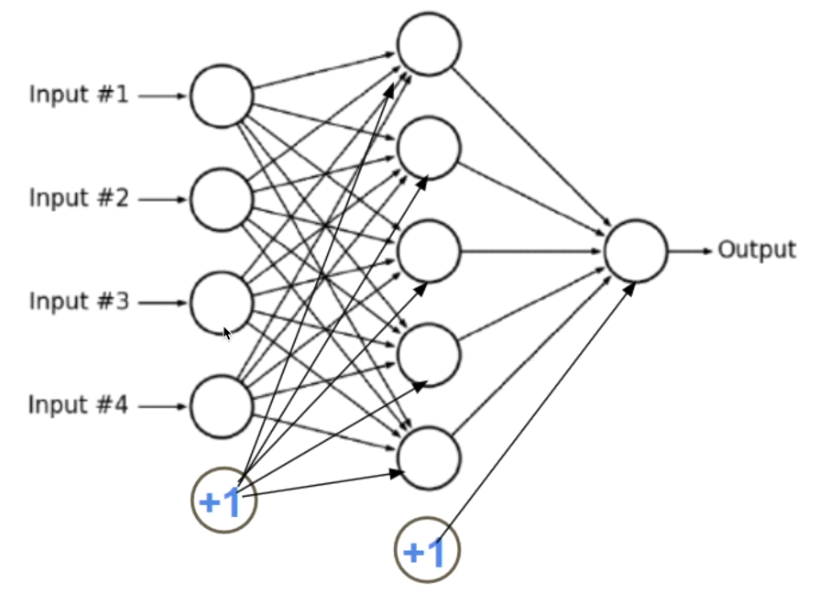

In [7]:
from IPython.display import Image
Image('../Ejercicios_Propios/mlp.png')

In [8]:
# dos funciones de activacion
def fn_identidad(x, derivada=False):
    if derivada:
        return np.ones(x.shape)

In [9]:
# funcion de activacion para problemas binarios
def fn_sigmoide(x, derivada=False):
    if derivada:
        return x * (1 - x)
    return 1 / (1 + np.exp(-x))

In [10]:
# calcular el error de una prediccion (para el caso de clasificacion binaria)
def error_logloss(y_pred, y):
    v = np.clip(y_pred, 1e-15, 1-1e-15)
    if y == 1:
        return -np.log(v)
    else:
        return -np.log(1-v)

In [11]:
class Capa:
    def __init__(self, n_unidades, fn_activacion, bias=True):
        self.n_unidades = n_unidades
        self.fn_activacion = fn_activacion
        self.dim_output = n_unidades
        self.bias = bias
        self.dimensiones = 'no generadas'
        self.w = None
    # ver como esta procesando la capa
    def __repr__(self):
        return 'Capa: {} <==> dimensiones: {} <==> pesos: {}'.format(
            self.nombre, self.dimensiones, self.w)
    
    def add_bias(self, x):
        if not self.bias:
            return x
        x_con_bias = np.append(1,x)
        return x_con_bias.reshape(x_con_bias.shape[0], 1)
    
    def generar_pesos(self, dim_anterior):
        if self.bias:
            self.dimensiones = (self.n_unidades, dim_anterior + 1)
        else:
            self.dimensiones = (self.n_unidades, dim_anterior)
        
        self.w = np.random.random(self.dimensiones)
        
    def activar(self, x):
        x_con_bias_2d = self.add_bias(x)
        return self.fn_activacion(self.w @ x_con_bias_2d)
    
    def calcular_delta(self, producto_capa, output_capa):
        return producto_capa * self.fn_activacion(output_capa, derivada=True)

In [12]:
class CapaInput(Capa):
    nombre = 'entrada'
    
    def generar_pesos(self):
        pass
    
    def activar(self, x):
        return x

class CapaOculta(Capa):
    nombre = 'oculta'
    
class CapaSalida(Capa):
    nombre = 'salida'

In [13]:
class RedNeuronal:
    def __init__(self, ratio_aprendizaje, fn_error):
        self.layers = []
        self.ratio_aprendizaje = ratio_aprendizaje
        self.fn_error = fn_error
        
    def add_layer(self, layer):
        if layer.nombre == 'entrada':
            layer.generar_pesos()
        else:
            layer.generar_pesos(self.layers[-1].dim_output)
        self.layers.append(layer)
        
    def __repr__(self):
        info = ' '
        for layer in self.layers:
            info += 'n\Capa: {}  unidades: {}'.format(layer.nombre, layer.n_unidades)
        
        return info
    
    def forward(self, x):
        for layer in self.layers:
            layer.input = layer.add_bias(x).T
            x = layer.activar(x)
            layer.output = x
        
        return x
    
    def calcular_error_prediccion(self, y_pred, y):
        return self.fn_error(y_pred, y)
    
    def backward(self, y_pred, y):
        delta_capa = self.calcular_error_prediccion(y_pred, y)
        for layer in reversed(self.layers):
            if layer.nombre == 'entrada':
                continue
            if layer.nombre == 'salida':
                producto_capa = delta_capa @ layer.w
            else:
                producto_capa = delta_capa[:,1:] @ layer.w
            delta_capa = layer.calcular_delta(producto_capa, layer.output)
            layer.delta = delta_capa
    
    def actualizar_pesos(self):
        for layer in self.layers[1:]:
            layer.w = layer.w - self.ratio_aprendizaje * layer.delta * layer.input
            
    def aprendizaje(self, x, y):
        # funcion principal de la red
        y_pred = self.forward(x)
        self.backward(y_pred, y)
        self.actualizar_pesos
        error_prediccion = self.calcular_error_prediccion(y_pred, y)
        return error_prediccion
    
    def predict_proba(self, x):
        return self.forward(x)
    
    def predict(self, x):
        probabilidad = self.predict_proba(x)
        if probabilidad >= 0.5:
            return 1
        else:
            return 0

In [14]:
# construccion de la red
n_input = 4 # num de neuronas input
n_oculta = 5 # num neuronas en capa oculta
n_output = 1 # num neuronas en capa de salida

ratio_aprendizaje = 0.0001 # alfa
# se crea la red neuronal
red_1 = RedNeuronal(ratio_aprendizaje=ratio_aprendizaje, fn_error=error_logloss)
# se agrega una capa input a la red neuronal
# fn_activacion es identidad en input pq aun no le toca tomar decisiones
# bias es false al principio pq aun no hay sesgo
red_1.add_layer(CapaInput(n_unidades=n_input, fn_activacion=fn_identidad, bias=False))
# agregar capa oculta
red_1.add_layer(CapaOculta(n_unidades=n_oculta, fn_activacion=fn_sigmoide, bias=True))
# agregar capa output
red_1.add_layer(CapaSalida(n_unidades=n_output, fn_activacion=fn_sigmoide, bias=True))

In [15]:
red_1.layers

[Capa: entrada <==> dimensiones: no generadas <==> pesos: None,
 Capa: oculta <==> dimensiones: (5, 5) <==> pesos: [[0.26191266 0.44601671 0.90687106 0.82575583 0.0887175 ]
  [0.22353442 0.5638645  0.26384232 0.86425504 0.46939896]
  [0.15946207 0.81455569 0.56404053 0.25537657 0.71562438]
  [0.0984607  0.84320376 0.94598351 0.39102243 0.27888823]
  [0.02428356 0.26346421 0.22643302 0.45637676 0.85394781]],
 Capa: salida <==> dimensiones: (1, 6) <==> pesos: [[0.97340254 0.16578067 0.09780066 0.80040416 0.15681417 0.37483811]]]

In [16]:
red_1.aprendizaje(x0, y0)

array([[2.19450452]])

In [20]:
def iteracion(red, X, y):
    indice_random = np.random.permutation(X.shape[0])
    error = []
    for i in range(indice_random.shape[0]):
        x0 = X[indice_random[i]]
        y0 = y[indice_random[i]]
        err = red.aprendizaje(x0, y0)
        error.append(err)
    return np.array(error)

In [21]:
def entrenar_red(red, n_epocas, X, y):
    # epoca (es cuando la RN ha procesado TODO el dataset)
    epocas = []
    for epoca in range(n_epocas):
        error_epoca = iteracion(red, X, y)
        epocas.append([epoca, error_epoca])
        
    return np.array(epocas)

In [22]:
numero_epocas = 500
resultados = entrenar_red(red_1, numero_epocas, X_std, y)
resultados

C:\Users\patri\AppData\Local\Temp/ipykernel_6828/2268093205.py:8: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return np.array(epocas)


array([[0, array([[[0.18407746]],

                  [[0.13544851]],

                  [[0.26446032]],

                  [[0.15951729]],

                  [[0.19930231]],

                  [[0.18699492]],

                  [[0.22385179]],

                  [[2.26557721]],

                  [[0.2199402 ]],

                  [[0.23218572]],

                  [[2.59620074]],

                  [[0.22458663]],

                  [[2.62928644]],

                  [[2.59384095]],

                  [[0.21593372]],

                  [[2.56828083]],

                  [[0.13669001]],

                  [[2.51878425]],

                  [[0.27307949]],

                  [[0.2702773 ]],

                  [[0.28130535]],

                  [[0.27845713]],

                  [[2.01204716]],

                  [[2.31955747]],

                  [[0.2064627 ]],

                  [[0.2652701 ]],

                  [[0.29284054]],

                  [[0.143476  ]],

                  [[

In [23]:
resultados.shape

(500, 2)

ValueError: setting an array element with a sequence.

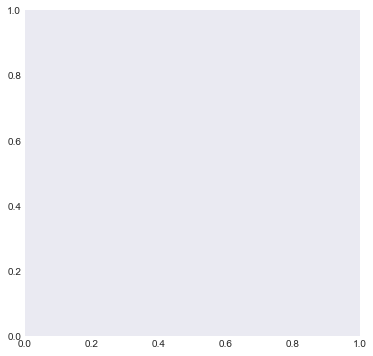

In [29]:
plt.scatter(x=resultados[:,0],y=resultados[:,1])
plt.xlabel('Iteraciones')
plt.ylabel('Error')
plt.show()

In [27]:
resultados[:,0].shape[0]

500